<a href="https://colab.research.google.com/github/munisdev86/stable-diffusion/blob/main/dreambooth_sdxl_inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install diffusers --upgrade


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.3/961.3 kB 13.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 33.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.9 MB/s eta 0:00:00
  Created wheel for diffusers: filename=diffusers-0.19.1-py3-none-any.whl size=1318528 sha256=a8f510492237654e8ed085fa2db75da3339125dac6cdac3b63a588b10748aa52
  Stored in directory: /root/.cache/pip/wheels/bd/4d/d3/85c4ff768cd8b5077f3f042380aec3b3fcef20d174ac830ecd
Successfully built diffusers


In [2]:
!pip install invisible-watermark>=0.2.0

In [3]:
!pip install  transformers accelerate safetensors

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 58.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.2/244.2 kB 30.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 115.5 MB/s eta 0:00:00


In [ ]:
from huggingface_hub.repocard import RepoCard
from diffusers import DiffusionPipeline
import torch

lora_model_id = "Muniyaraj/output_model"
card = RepoCard.load(lora_model_id)
base_model_id = card.data.to_dict()["base_model"]

pipe = DiffusionPipeline.from_pretrained(base_model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")
pipe.load_lora_weights(lora_model_id)
image = pipe("A picture of a muniyarajs closeup , formal suite, half body pose, sun kissed, 8k", num_inference_steps=25).images[0]
image.save("muni1.png")

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

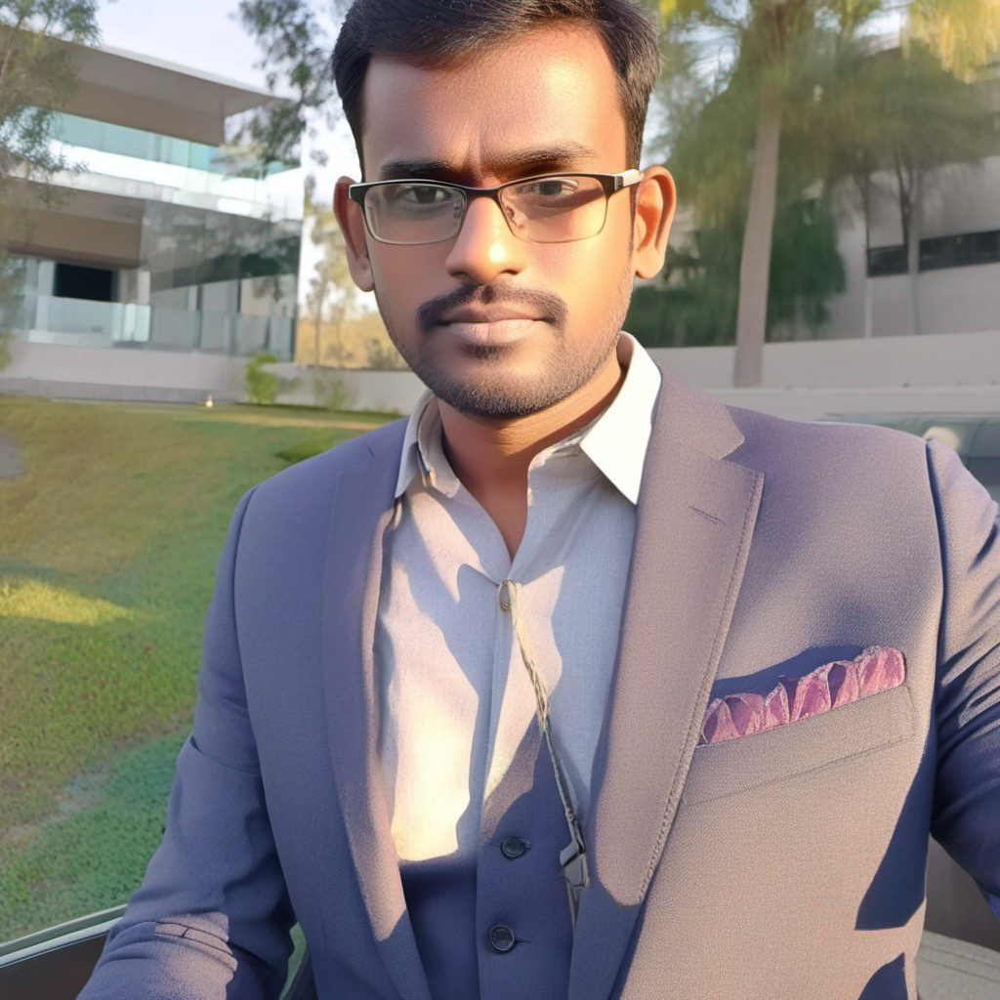

In [ ]:
image

In [ ]:
image = pipe("A picture of a muniyarajs in formal suite, half body pose, sun kissed, 8k", num_inference_steps=25).images[0]
image.save("muni2.png")

  0%|          | 0/25 [00:00<?, ?it/s]

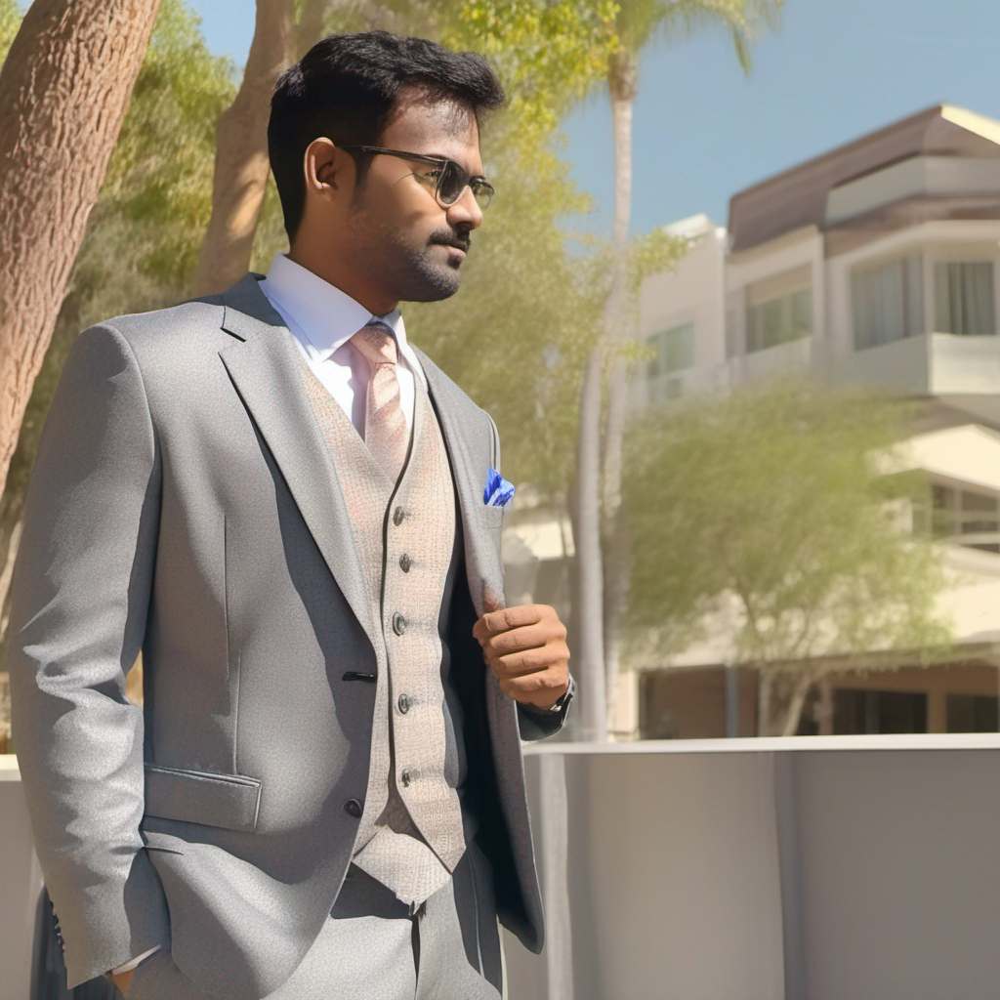

In [ ]:
image

In [ ]:
#refiner

In [4]:
from huggingface_hub.repocard import RepoCard
from diffusers import DiffusionPipeline, StableDiffusionXLImg2ImgPipeline
import torch

lora_model_id = "Muniyaraj/output_model"
card = RepoCard.load(lora_model_id)
base_model_id = card.data.to_dict()["base_model"]

# Load the base pipeline and load the LoRA parameters into it.
pipe = DiffusionPipeline.from_pretrained(base_model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")
pipe.load_lora_weights(lora_model_id)

# Load the refiner.

refiner = StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16"
)
refiner.to("cuda")

prompt = "A picture of a muniyarajs closeup , formal suite, half body pose, sun kissed, 8k"
generator = torch.Generator("cuda").manual_seed(0)

# Run inference.
image = pipe(prompt=prompt, output_type="latent", generator=generator).images[0]
image = refiner(prompt=prompt, image=image[None, :], generator=generator).images[0]
image.save("refined_muni1.png")

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

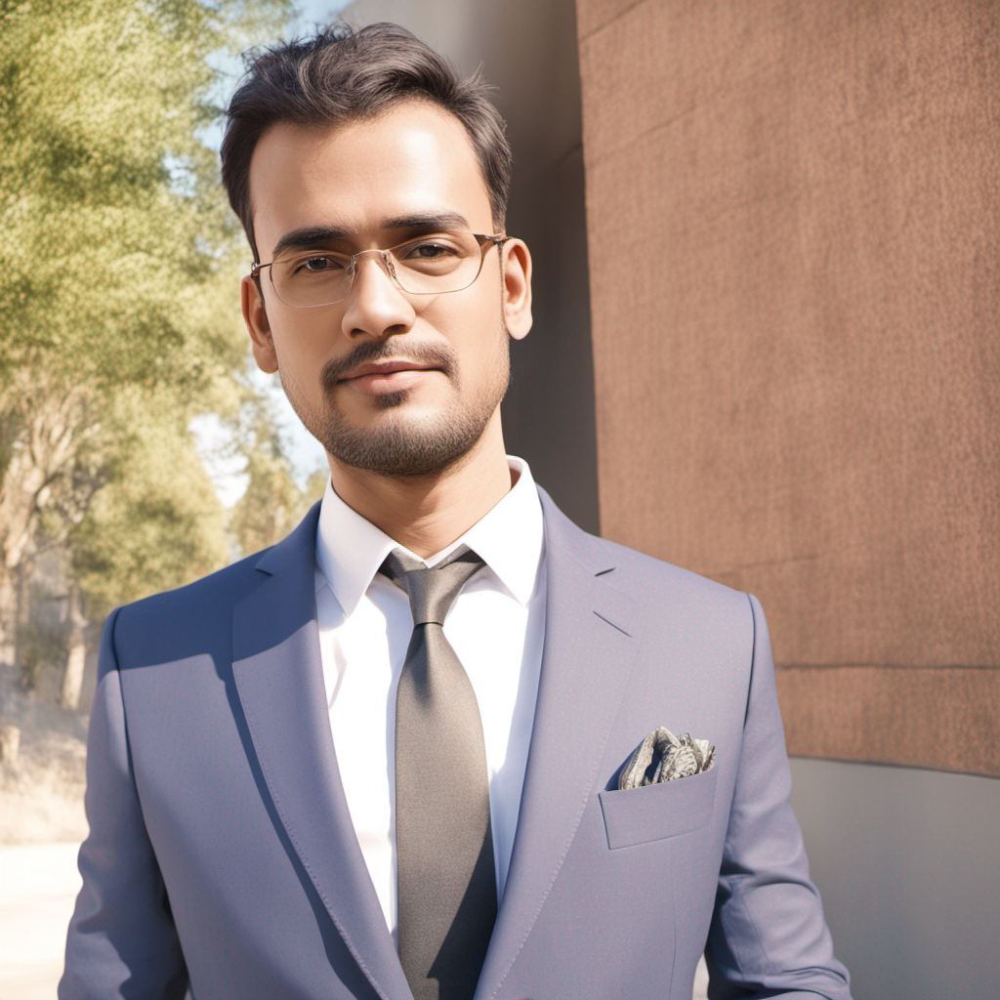

In [5]:
image

  0%|          | 0/50 [00:00<?, ?it/s]

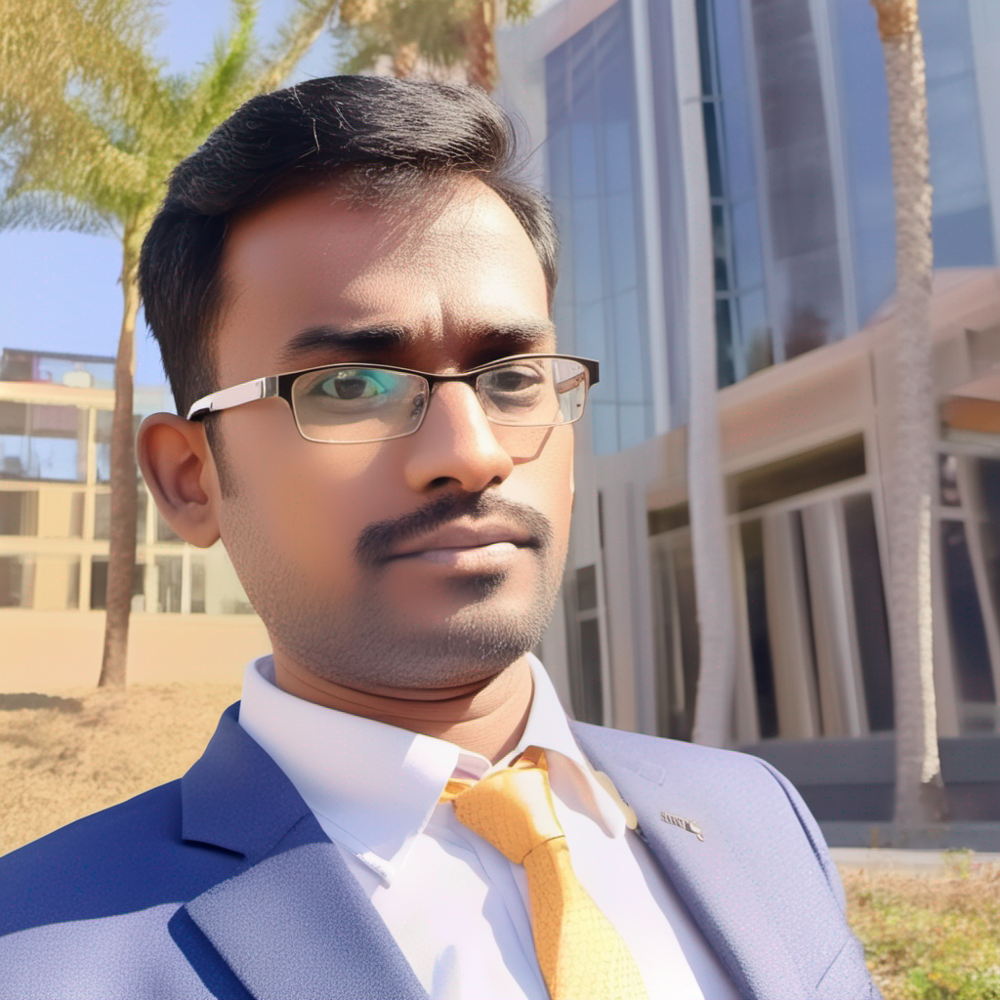

In [8]:
image = pipe(prompt=prompt, generator=generator).images[0]
image

  0%|          | 0/15 [00:00<?, ?it/s]

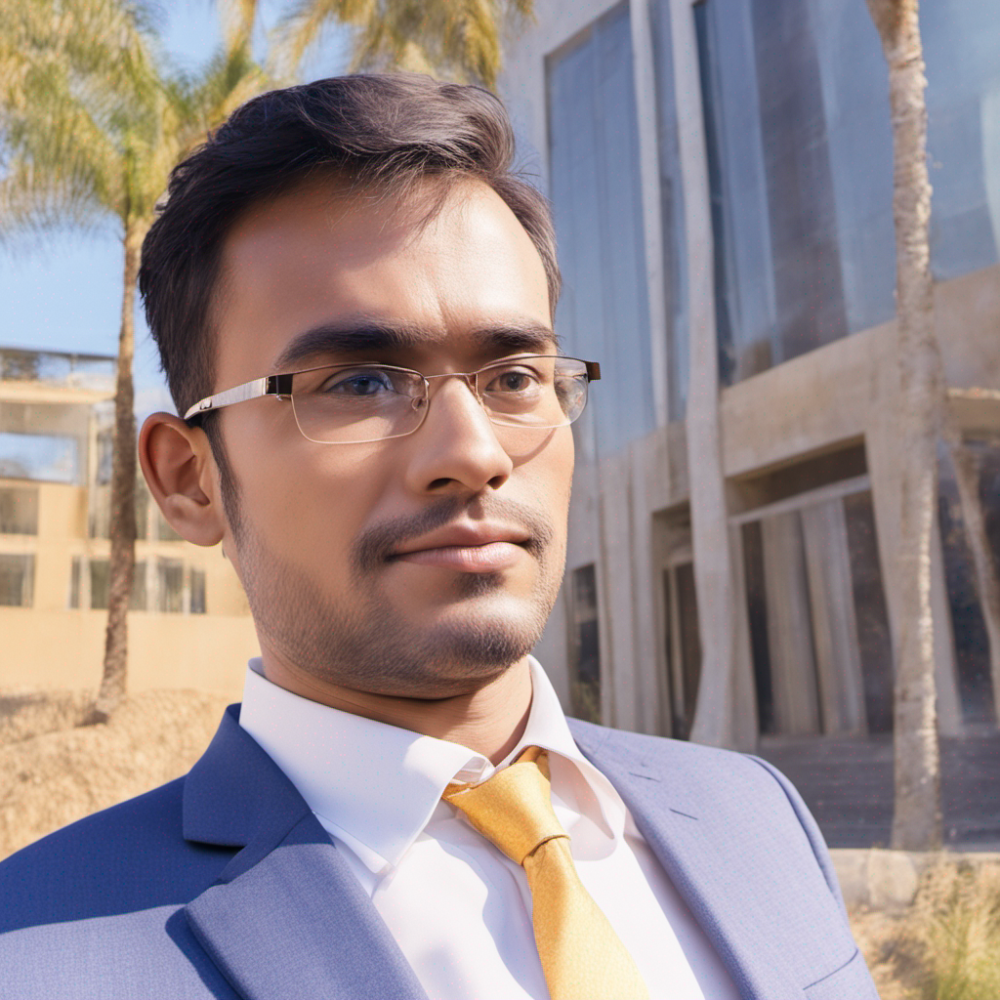

In [9]:
ref_image = refiner(prompt=prompt, image=image, generator=generator).images[0]
ref_image

In [ ]:
!nvidia-smi

Fri Jul 28 03:30:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

  0%|          | 0/50 [00:00<?, ?it/s]

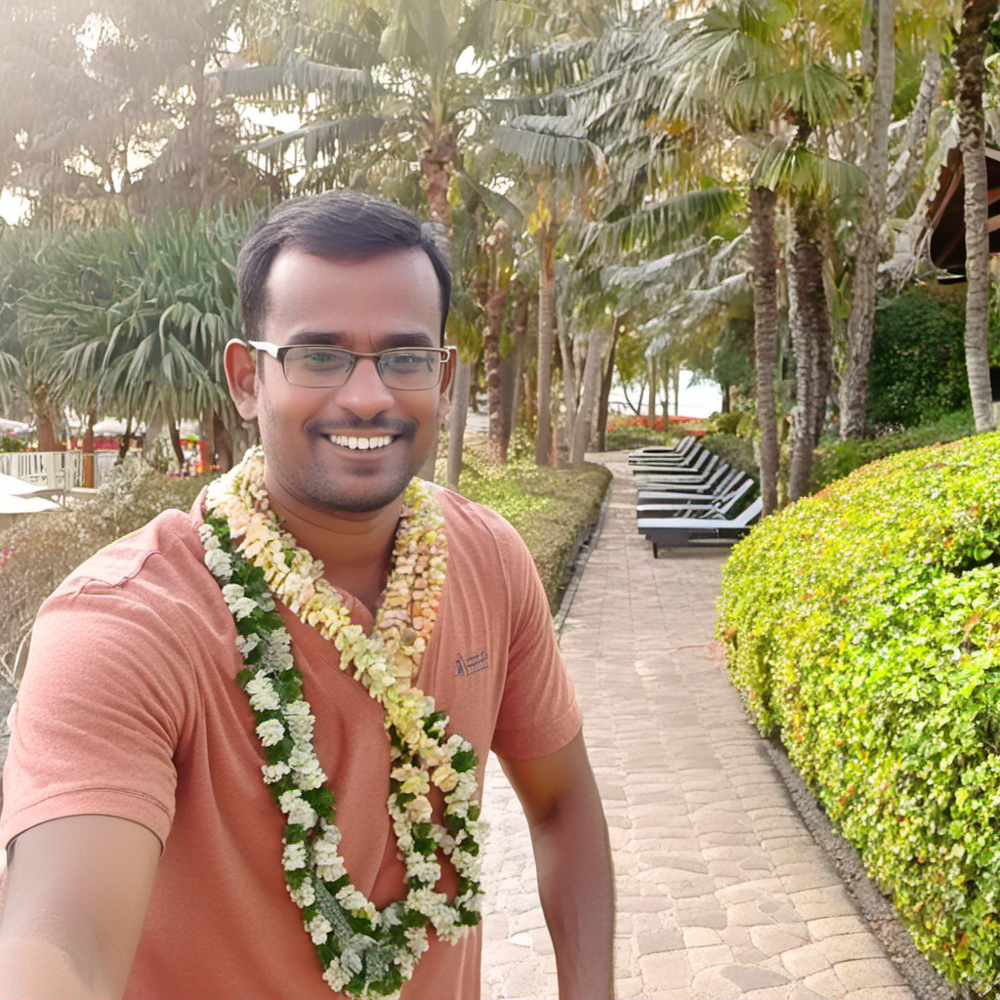

In [14]:
prompt = 'a picture of muniyarajs , smiling man, on a beach side resort, hawaian outfit, sun kissed'
image = pipe(prompt=prompt, generator=generator).images[0]
image


  0%|          | 0/50 [00:00<?, ?it/s]

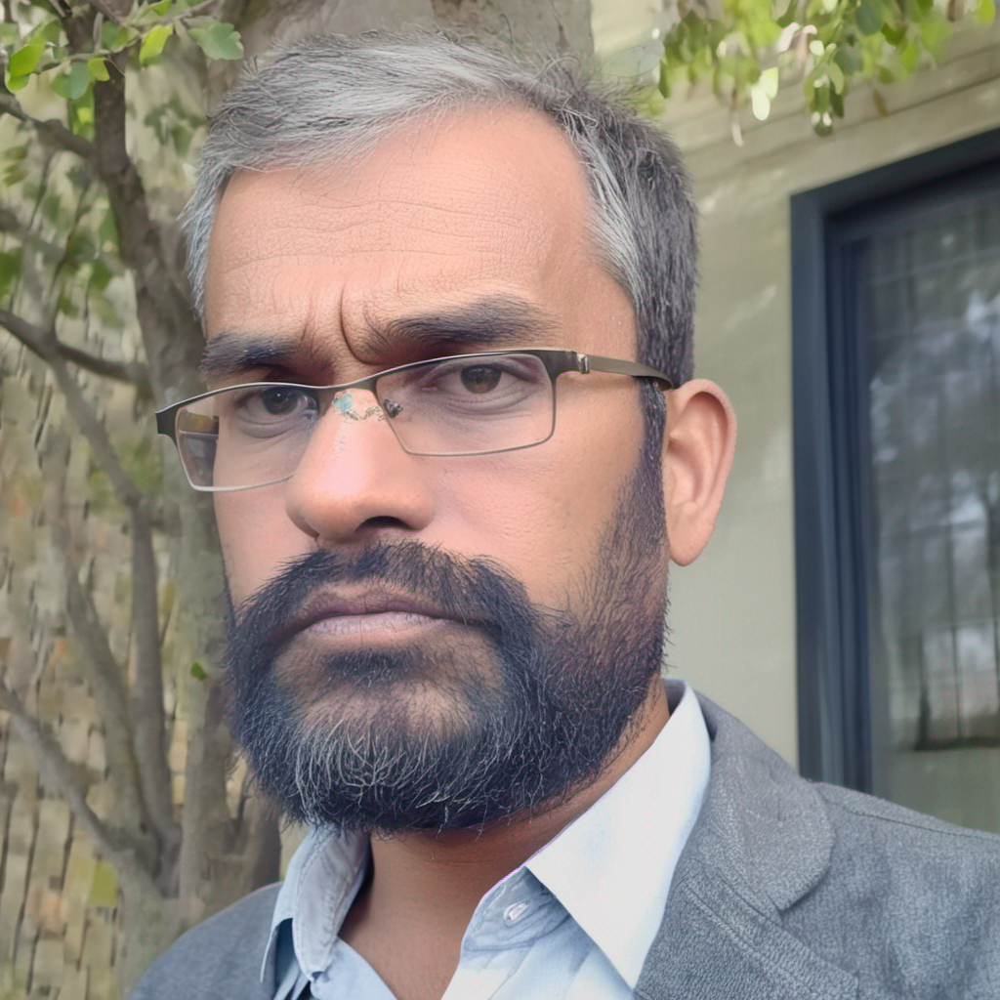

In [15]:
prompt = 'Photo of a brooding serious bearded old'
image = pipe(prompt=prompt, generator=generator).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

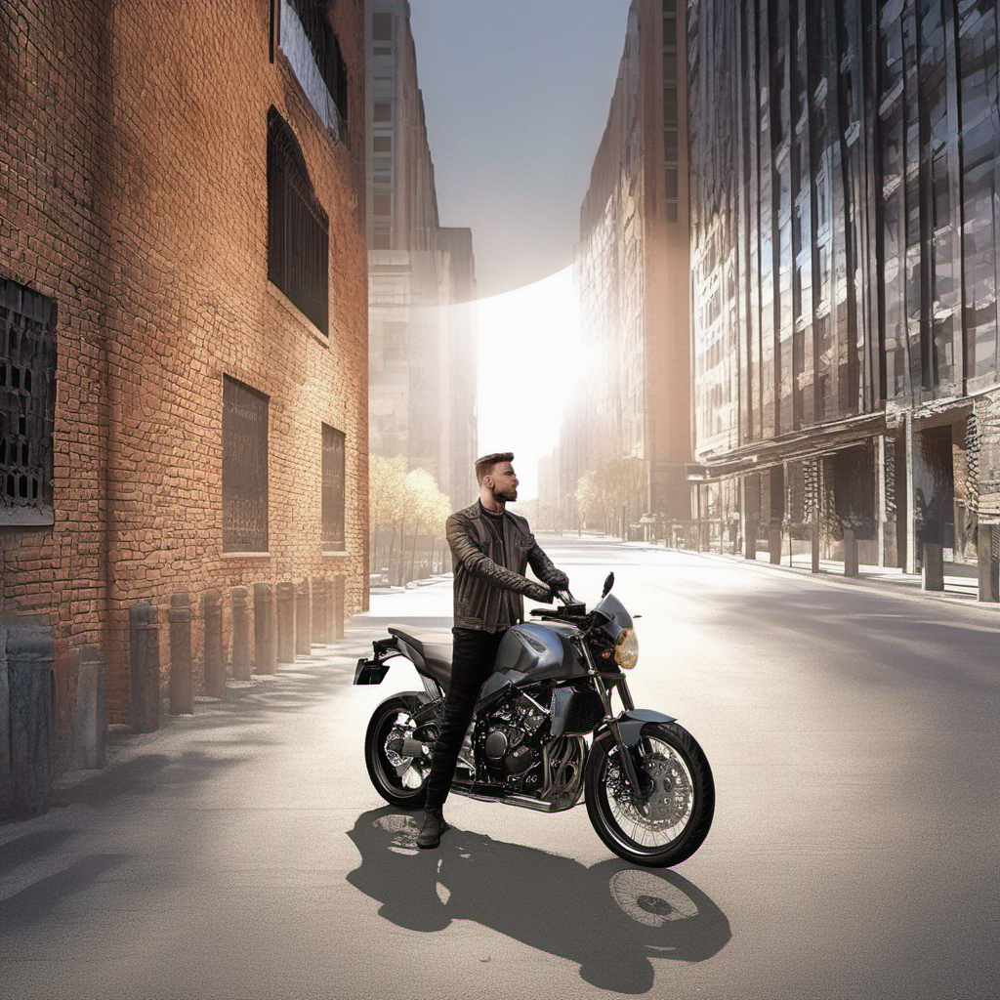

In [16]:
prompt='Man in a leather jacket standing next to a motorcycle light shadow effects intricate highly detailed digital'
image = pipe(prompt=prompt, generator=generator).images[0]
image